<a href="https://colab.research.google.com/github/yassmin1/Analytics_Projects/blob/main/apartments_for_rent_in_warsaw_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Project Title: Analyzing Apartment Rent in Warsaw,

### Project Objective:
The primary goal of this project is to gain a comprehensive understanding of apartment rental prices in Warsaw, the capital of Poland. The analysis will focus on discerning the influence of various factors, such as apartment size, location, and other features, on the rental prices in the city.

### Project Phases:

1. **Data Cleaning:**
   - The initial phase involves meticulous data cleaning to ensure the dataset is well-prepared for subsequent utilization in machine learning algorithms.
2. Exploratory Data Analysis (EDA):
This phase entails comprehensive exploration of the dataset to uncover patterns, trends, and anomalies. Techniques such as summary statistics, data visualization (e.g., histograms, scatter plots, box plots), and correlation analysis are employed to understand the distribution and relationships among variables. This step provides valuable insights into the underlying structure of the data, helping to inform subsequent analysis and decision-making processes.



### Data Source:

- The dataset used for this analysis is available on Kaggle at the following link:
  [Apartment Prices in Poland Dataset](https://www.kaggle.com/datasets/krzysztofjamroz/apartment-prices-in-poland/data)

### Data Fields:

The dataset comprises the following key fields:

- **city:** The name of the city where the property is located.
- **type:** Type of the building.
- **squareMeters:** The size of the apartment in square meters.
- **rooms:** The number of rooms in the apartment.
- **floor/floorCount:** The floor where the apartment is located and the total number of floors in the building.
- **buildYear:** The year when the building was constructed.
- **latitude, longitude:** Geo-coordinates of the property.
- **centerDistance:** Distance from the city center in kilometers.
- **poiCount:** Number of points of interest in a 500-meter range from the apartment, including schools, clinics, post offices, kindergartens, restaurants, colleges, and pharmacies.
- **[poiName]Distance:** Distance to the nearest point of interest, categorized by schools, clinics, post offices, kindergartens, restaurants, colleges, and pharmacies.
- **ownership:** The type of property ownership.
- **condition:** The condition of the apartment.
- **has[features]:** Indicates whether the property has key features such as an assigned parking space, balcony, elevator, security, or a storage room.
- **price:** The offered price in Polish Zloty, including sale prices and monthly rent for sale and rent offers, respectively.

--

### Import libraries and data

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
!pip install mapclassify
! pip install scipy
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from zipfile import ZipFile
from shapely.geometry import Point
import geopandas as gpd
import folium
import mapclassify
from folium.plugins import MarkerCluster,HeatMap

plt.rcParams['figure.figsize'] = (10, 7)
sns.set_theme(font_scale=1.5, style='whitegrid', palette='bright')


In [ ]:
#apartment rental data
aptfile="/content/drive/MyDrive/Colab Notebooks/Py_PB_Project/Poland_houses/Ploland_apt_priceing.zip"
rent_2023_11 = pd.read_csv(ZipFile(aptfile).open('apartments_rent_pl_2023_11.csv'))
rent_2023_11 = rent_2023_11.assign(date='November 2023')

rent_2023_12 = pd.read_csv(ZipFile(aptfile).open('apartments_rent_pl_2023_12.csv'))
rent_2023_12 = rent_2023_12.assign(date='December 2023')

rent_2024_01 = pd.read_csv(ZipFile(aptfile).open('apartments_rent_pl_2024_01.csv'))
rent_2024_01 = rent_2024_01.assign(date='January 2024')

df = pd.concat([rent_2023_11, rent_2023_12, rent_2024_01])
df.rename(columns={"centreDistance":"centerDistance"},inplace=True)
df.head()



,id,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,...,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price,date
0,2a1a6db97ff122d6bc148abb6f0e498a,szczecin,blockOfFlats,52.0,2.0,3.0,3.0,2008.0,53.460535,14.545416,...,condominium,brick,NaN,yes,yes,no,no,no,3500,November 2023
1,5a0cb42c088eadf75aa98a4118640048,szczecin,blockOfFlats,57.0,3.0,NaN,10.0,1976.0,53.440955,14.566024,...,condominium,NaN,premium,no,yes,yes,no,no,3000,November 2023
2,996722490efcb4b34d48bb84a9a72838,szczecin,NaN,43.4,2.0,3.0,4.0,NaN,53.435746,14.560764,...,condominium,NaN,NaN,no,yes,no,no,no,1900,November 2023
3,50d75c688530b9a61ba505301e0b94a9,szczecin,apartmentBuilding,32.6,2.0,5.0,6.0,2021.0,53.421582,14.541572,...,condominium,brick,premium,no,yes,yes,no,no,2500,November 2023
4,9b187f4203adabf466fd08610d8f4e5e,szczecin,apartmentBuilding,72.0,3.0,6.0,6.0,2014.0,53.450010,14.547230,...,condominium,brick,premium,no,yes,yes,no,yes,2999,November 2023


In [ ]:
df[df.id.duplicated()].sort_values('id')

,id,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,...,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price,date
5286,00046165fd78ed4f5468013bf127adc7,warszawa,NaN,70.00,4.0,3.0,10.0,1980.0,52.180430,21.047990,...,condominium,NaN,NaN,no,yes,yes,no,no,3800,January 2024
4888,0019cfeaf675c1f5d3aae1560ed8c499,warszawa,apartmentBuilding,48.40,2.0,2.0,5.0,2010.0,52.262298,20.980656,...,condominium,brick,NaN,no,yes,yes,no,no,4000,January 2024
4823,001c7d1166a1868d4d953b3cab88f8fa,warszawa,NaN,70.00,3.0,2.0,4.0,NaN,52.166500,21.078900,...,condominium,NaN,NaN,no,no,NaN,no,no,4990,January 2024
5228,001c7d1166a1868d4d953b3cab88f8fa,warszawa,NaN,70.00,3.0,2.0,4.0,NaN,52.166500,21.078900,...,condominium,NaN,NaN,no,no,NaN,no,no,4990,December 2023
6060,001d786c8ecc31cbb3afc439fbbab61f,warszawa,blockOfFlats,60.00,2.0,4.0,7.0,NaN,52.193740,21.034600,...,condominium,NaN,NaN,no,yes,yes,no,no,4400,January 2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12,ffcc61d671b9c9f88c0b100776a39210,szczecin,apartmentBuilding,36.00,2.0,5.0,7.0,2022.0,53.421500,14.542000,...,condominium,brick,NaN,yes,yes,yes,yes,no,2400,January 2024
1649,ffd105a6e10b35dc02fe0fbdaaf30286,krakow,NaN,46.00,2.0,1.0,3.0,NaN,50.067343,19.988855,...,condominium,NaN,premium,no,no,no,no,no,3300,January 2024
4803,ffe5e2d89ea0457da9b3739191ba8cd7,warszawa,apartmentBuilding,54.00,2.0,4.0,7.0,2004.0,52.146775,21.050082,...,condominium,brick,NaN,yes,yes,yes,yes,no,2700,January 2024
3683,fff57a74e696a87789c50ce1226714fd,lodz,tenement,31.15,2.0,4.0,4.0,1904.0,51.771272,19.454857,...,condominium,brick,NaN,no,no,yes,no,no,1850,January 2024


In [ ]:
#I am only interested in Warsaw data
df_city = df[(df['city'] == 'warszawa')].copy()
df_city.drop(columns=['id', 'city'], inplace=True)

df_city.head()

,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,centerDistance,poiCount,...,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price,date
4660,apartmentBuilding,47.0,2.0,8.0,9.0,2020.0,52.257912,20.968610,3.76,33.0,...,condominium,brick,premium,yes,yes,yes,no,no,5000,November 2023
4661,NaN,27.0,1.0,3.0,7.0,2020.0,52.249800,21.035200,2.95,33.0,...,condominium,NaN,NaN,yes,yes,yes,no,no,2950,November 2023
4662,apartmentBuilding,51.0,2.0,5.0,7.0,2010.0,52.222864,21.009959,1.08,85.0,...,condominium,brick,NaN,no,yes,yes,no,no,3700,November 2023
4663,tenement,50.0,3.0,3.0,5.0,1913.0,52.224948,21.012136,0.95,124.0,...,condominium,brick,NaN,no,no,yes,no,no,5000,November 2023
4664,tenement,39.8,2.0,2.0,3.0,1939.0,52.216513,21.041474,3.09,6.0,...,condominium,brick,NaN,no,no,no,no,no,4500,November 2023


In [ ]:
## Use the duplicated() method to find duplicated records
duplicated_records = df_city[df_city.duplicated()]
print(duplicated_records.shape)
# Use the drop_duplicates() method to remove the duplicates
print(df_city.drop_duplicates().shape)
# modify the original DataFrame in-place, you can use the inplace parameter
df_city.drop_duplicates(inplace=True)

(80, 27)
(10739, 27)


### Data Cleaning

In [ ]:
# let's check the data type and whether there are empty values
df_city.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10739 entries, 4660 to 8271
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  7338 non-null   object 
 1   squareMeters          10739 non-null  float64
 2   rooms                 10739 non-null  float64
 3   floor                 9650 non-null   float64
 4   floorCount            10581 non-null  float64
 5   buildYear             7777 non-null   float64
 6   latitude              10739 non-null  float64
 7   longitude             10739 non-null  float64
 8   centerDistance        10739 non-null  float64
 9   poiCount              10739 non-null  float64
 10  schoolDistance        10739 non-null  float64
 11  clinicDistance        10738 non-null  float64
 12  postOfficeDistance    10739 non-null  float64
 13  kindergartenDistance  10724 non-null  float64
 14  restaurantDistance    10699 non-null  float64
 15  collegeDistance  

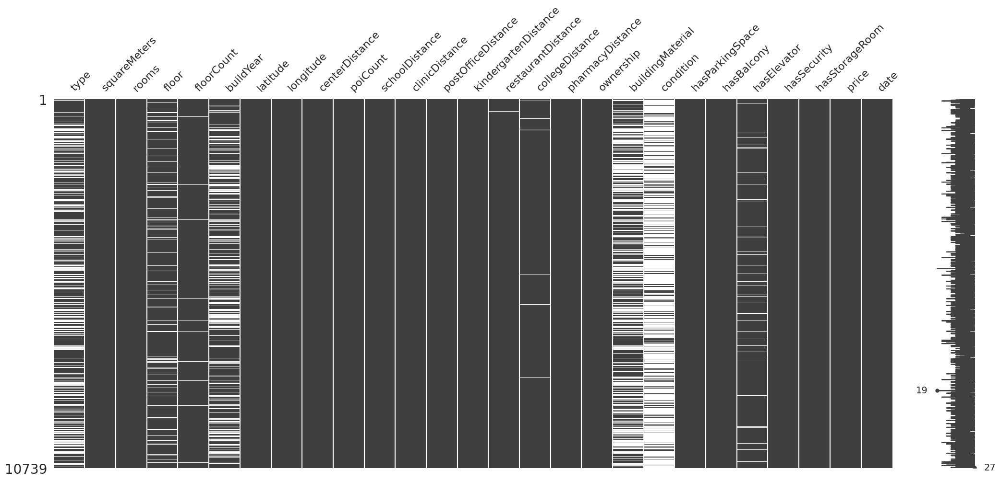

In [ ]:
# let's check where and how much data is missing
import missingno as msno

msno.matrix(df_city)
plt.show()

In [ ]:
# what values do the 'type', 'condition' and 'ownership' columns contain
print(df_city['type'].unique())
print(df_city['condition'].unique())
print(df_city['ownership'].unique())

['apartmentBuilding' nan 'tenement' 'blockOfFlats']
['premium' nan 'low']
['condominium']


In [ ]:
#let's convert them to numerical values to see how they correlate with the price
df_city['type_numerical'] = pd.factorize(df_city['type'])[0]
df_city['condition_numerical'] = pd.factorize(df_city['condition'])[0]
df_city = df_city.drop('type', axis=1)
df_city = df_city.drop('condition', axis=1)

<ipython-input-75-057352fb5794>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask=np.triu(np.ones_like(df_city.corr(), dtype=np.bool)),cbar=False
<ipython-input-75-057352fb5794>:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask=np.triu(np.ones_like(df_city.corr(), dtype=np.bool)),cbar=False


<Axes: >

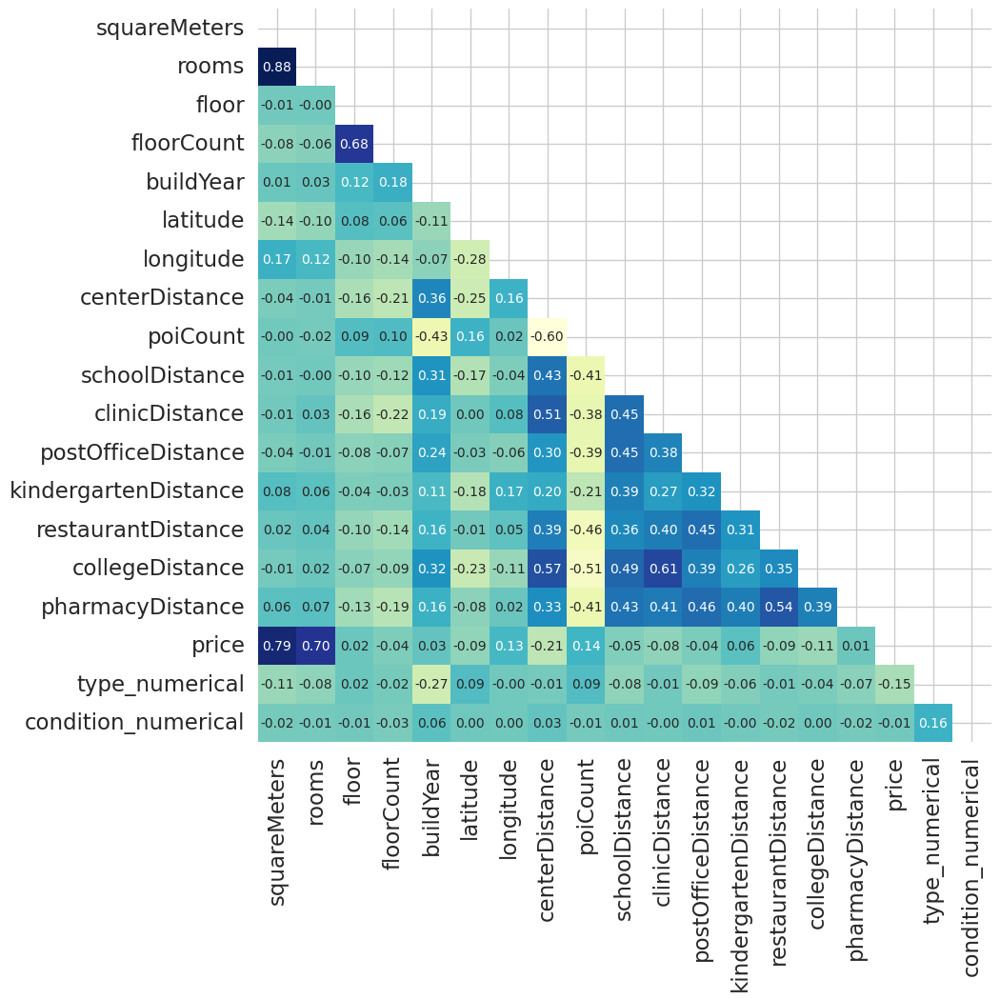

In [ ]:
plt.figure(figsize=(16,10))
sns.heatmap(df_city.corr(numeric_only = True), cmap='YlGnBu', annot=True, fmt='.2f',square=True,annot_kws=dict(size=10),

            mask=np.triu(np.ones_like(df_city.corr(), dtype=np.bool)),cbar=False

            )

In [ ]:
# Several columns have a lot of missing values for this project I willjust drop them.
# I also remove ownership since it only takes one value

rare_columns = ['buildYear', 'buildingMaterial','condition_numerical',
                'schoolDistance', 'clinicDistance','kindergartenDistance','restaurantDistance','collegeDistance',
                'pharmacyDistance','postOfficeDistance','ownership']
df_city.drop(columns=rare_columns, inplace=True)

In [ ]:
# the 'type' and 'floor' and 'floorCount' column have impact on the price so I will imputed with median
# let's fill the data with median value
median_type = df_city['type_numerical'].median()
median_floor = df_city['floor'].median()
median_floorCount = df_city['floorCount'].median()

df_city['type_numerical'].fillna(median_type, inplace=True)
df_city['floor'].fillna(median_floor, inplace=True)
df_city['floorCount'].fillna(median_floorCount, inplace=True)


In [ ]:
# there are not many missing values in the hasElevator binary column.
# let's complete it with the value that occurs more often
counts = df_city['hasElevator'].value_counts(dropna=False)
print(counts)


yes    7255
no     3045
NaN     439
Name: hasElevator, dtype: int64


In [ ]:
df_city['hasElevator'].fillna('yes', inplace=True)

In [ ]:
#converting categorical columns to binary
columns_to_change = ['hasParkingSpace', 'hasBalcony', 'hasSecurity','hasStorageRoom','hasElevator']
maping = {'yes': 1, 'no': 0}

df_city[columns_to_change] = df_city[columns_to_change].applymap(lambda x: maping.get(x, x))


In [ ]:
#converting date to year and month column
df_city['date'] = pd.to_datetime(df_city['date'])

df_city['year'] = df_city['date'].dt.year
df_city['month'] = df_city['date'].dt.month
df_city=df_city.drop('date', axis=1)



In [ ]:
#Rearrange the dataframe. The price column moved to the end
temp_column = df_city.pop('price')
df_city['price'] = temp_column
df_city.head()


,squareMeters,rooms,floor,floorCount,latitude,longitude,centerDistance,poiCount,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,type_numerical,year,month,price
4660,47.0,2.0,8.0,9.0,52.257912,20.968610,3.76,33.0,1,1,1,0,0,0,2023,11,5000
4661,27.0,1.0,3.0,7.0,52.249800,21.035200,2.95,33.0,1,1,1,0,0,-1,2023,11,2950
4662,51.0,2.0,5.0,7.0,52.222864,21.009959,1.08,85.0,0,1,1,0,0,0,2023,11,3700
4663,50.0,3.0,3.0,5.0,52.224948,21.012136,0.95,124.0,0,0,1,0,0,1,2023,11,5000
4664,39.8,2.0,2.0,3.0,52.216513,21.041474,3.09,6.0,0,0,0,0,0,1,2023,11,4500


In [ ]:
df_city.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10739 entries, 4660 to 8271
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   squareMeters     10739 non-null  float64
 1   rooms            10739 non-null  float64
 2   floor            10739 non-null  float64
 3   floorCount       10739 non-null  float64
 4   latitude         10739 non-null  float64
 5   longitude        10739 non-null  float64
 6   centerDistance   10739 non-null  float64
 7   poiCount         10739 non-null  float64
 8   hasParkingSpace  10739 non-null  int64  
 9   hasBalcony       10739 non-null  int64  
 10  hasElevator      10739 non-null  int64  
 11  hasSecurity      10739 non-null  int64  
 12  hasStorageRoom   10739 non-null  int64  
 13  type_numerical   10739 non-null  int64  
 14  year             10739 non-null  int64  
 15  month            10739 non-null  int64  
 16  price            10739 non-null  int64  
dtypes: float64

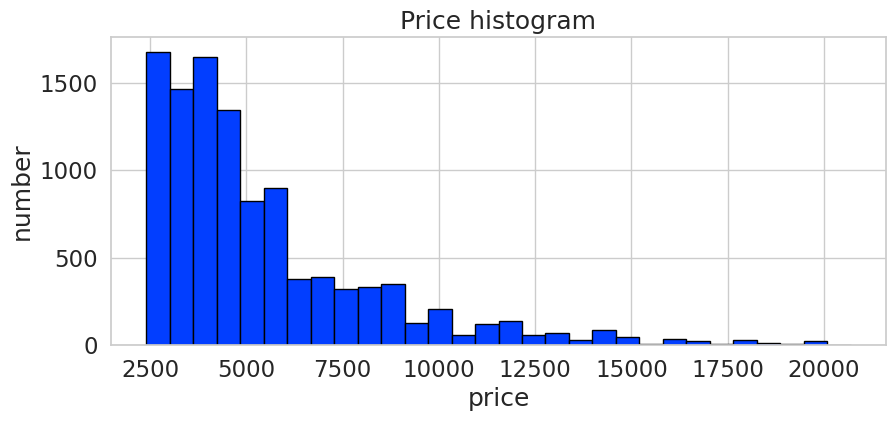

In [ ]:
# let's take a closer look at the price
df_city['price'].hist(figsize=(10,4), bins=30, edgecolor='black')
plt.title(f'Price histogram')
plt.xlabel('price')
plt.ylabel('number')
plt.show()

In [ ]:
# Rather few people are interested in apartments for rent for PLN 20,000 per month.
# Let's limit the data to apartments that fall within the limit of Q3 + 1.5 * IQR
df_old=df_city

Q1 = np.percentile(df_city['price'], 25)
Q3 = np.percentile(df_city['price'], 75)
IQR = Q3 - Q1

upper_bound = Q3 + 1.5 * IQR
df_city = df_city[(df_city['price'] <= upper_bound)]


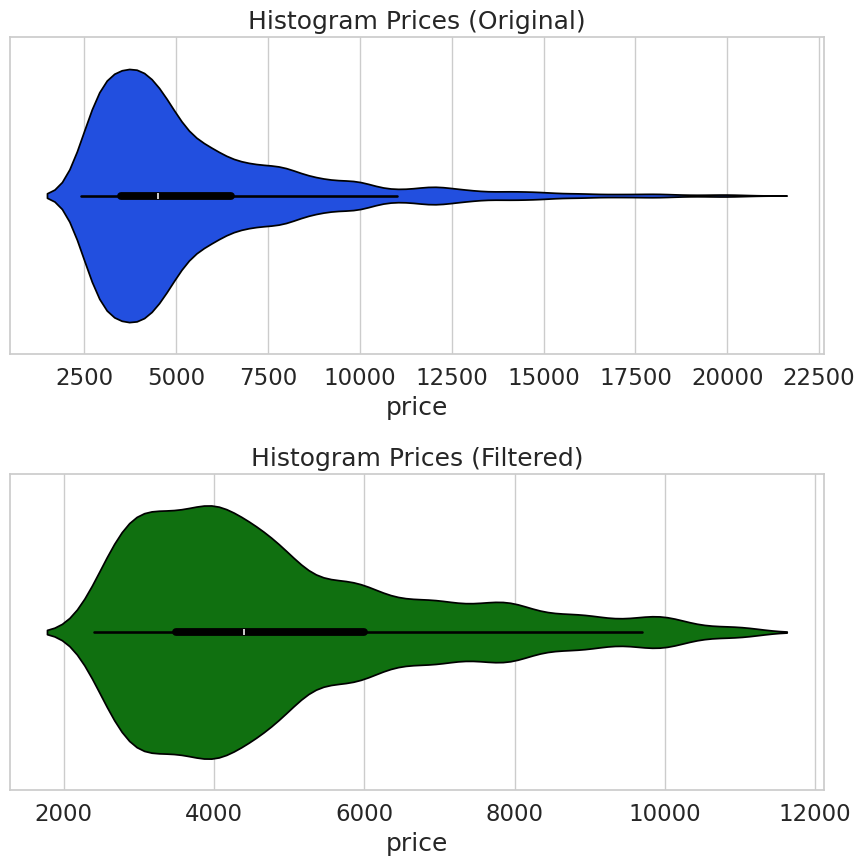

In [ ]:
# Create the first subplot
plt.figure(figsize=(9, 9))
plt.subplot(2, 1, 1)
sns.violinplot(df_old['price'], edgecolor='black',orient='y')
plt.title('Histogram Prices (Original)')

# Create the second subplot
plt.subplot(2, 1, 2)
sns.violinplot(df_city['price'], edgecolor='black',color='green',orient='y')
plt.title('Histogram Prices (Filtered)')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [ ]:
df=df_city.copy()


### EDA

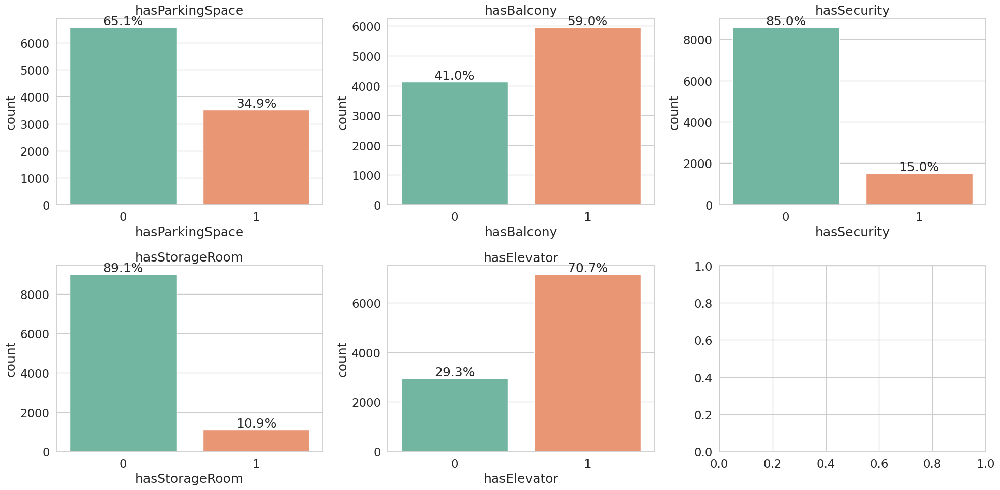

In [ ]:
binary_columns = ['hasParkingSpace', 'hasBalcony', 'hasSecurity','hasStorageRoom','hasElevator']

selected_df = df_city[binary_columns]

# Plot bar plots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 10))
for ax, column in zip(axes.flatten(), binary_columns):
    cp=sns.countplot(ax=ax,data=df_city[binary_columns],x=column,hue=column,palette=sns.color_palette("Set2",2),legend=False)

    ax.set_title(column)
    # Adding percentage labels
    total = len(df_city[column])
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2
        y = p.get_height()
        ax.annotate(percentage, (x, y), ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [ ]:
df.columns

Index(['squareMeters', 'rooms', 'floor', 'floorCount', 'latitude', 'longitude',
       'centerDistance', 'poiCount', 'hasParkingSpace', 'hasBalcony',
       'hasElevator', 'hasSecurity', 'hasStorageRoom', 'type_numerical',
       'year', 'month', 'price'],
      dtype='object')

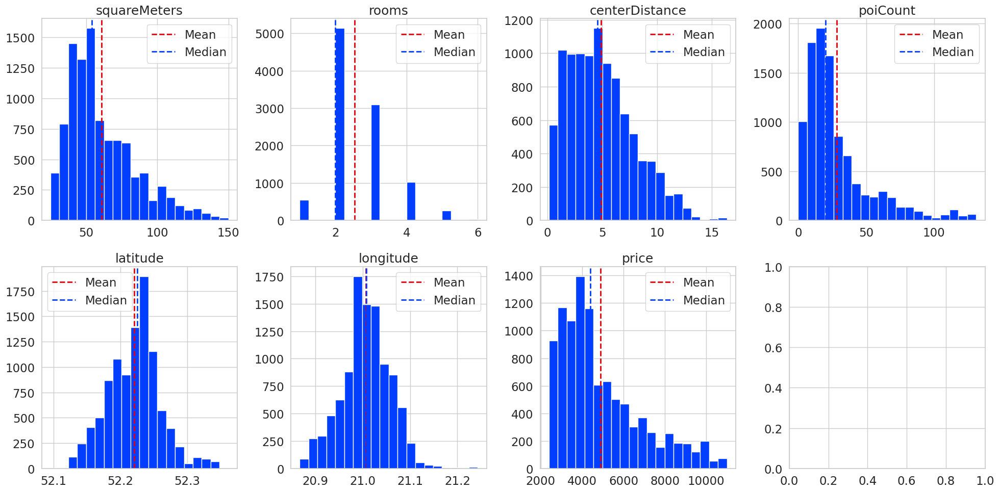

In [ ]:
selected_columns = ['squareMeters', 'rooms','centerDistance','poiCount','latitude','longitude','price']
selected_df = df[selected_columns]

# Plot histograms
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
for ax, column in zip(axes.flatten(), selected_df.columns):
    ax.hist(selected_df[column], bins=20)
    ax.axvline(selected_df[column].mean(), color='r', linestyle='dashed', linewidth=2, label='Mean')
    ax.axvline(selected_df[column].median(), color='b', linestyle='dashed', linewidth=2, label='Median')
    ax.set_title(column)
    ax.legend()

plt.tight_layout()
plt.show()


These results seem to be from a dataset with various features related to real estate properties. Let's discuss each column:

1. **squareMeters**: This column represents the area or size of the property in square meters. The mean size is around 60.69 square meters, with a standard deviation of approximately 23.81. The smallest property is 25 square meters, while the largest is 150 square meters.

2. **rooms**: This column likely denotes the number of rooms in each property. On average, properties have around 2.54 rooms, with a standard deviation of approximately 0.87. The minimum number of rooms is 1, while the maximum is 6.

3. **centerDistance**: This column might indicate the distance of each property from the city center. The mean distance is about 4.91 units, with a standard deviation of approximately 2.96. The closest property is 0.14 units away from the center, while the farthest is 16.36 units away.

4. **poiCount**: This column could represent the count of points of interest (POIs) near each property. On average, there are approximately 28.58 POIs, with a standard deviation of about 25.08. The minimum count is 0, while the maximum count is 131.

5. **latitude** and **longitude**: These columns provide the geographical coordinates of each property. The latitude ranges from approximately 52.095 to 52.362, while the longitude ranges from around 20.867 to 21.243.

6. **price**: This column denotes the price of each property. The average price is about 4904.45 units, with a standard deviation of approximately 1968.95. Prices range from 2400 units to 11000 units.

**Notes:**
- most apartments have an area of approximately 50 square meters
- the most popular are apartments with two rooms
- the further from the center of Warsaw, the fewer apartments - but there is a certain increase at a distance of about 4-5 km
- the price of most apartments is below PLN 5,000 (it is worth remembering that the data does not include rent)

**Note:**  
The size of the apartment and the number of rooms are most correlated with the price of the apartment

In [ ]:
selected_df.head(1)

,squareMeters,rooms,centerDistance,poiCount,latitude,longitude,price
4660,47.0,2.0,3.76,33.0,52.257912,20.96861,5000


In [ ]:
# Map plotting
# Step 1: Create a GeoDataFrame
geometry = [Point(xy) for xy in zip(selected_df.longitude, selected_df.latitude)]
df = selected_df.copy()
gdf = gpd.GeoDataFrame(df, crs="EPSG:4326", geometry=geometry)
gdf.explore(column='rooms',categorical=True,cmap='viridis')

In [ ]:
gdf.explore(column='squareMeters',cmap='magma')

In [ ]:


# Step 2: Save GeoDataFrame to a GeoJSON file
gdf.to_file("rentals_warso.geojson", driver="GeoJSON")
location=[round(gdf['geometry'].centroid.y.mean(),2), round(gdf['geometry'].centroid.x.mean(),2)]
print(location)
# Step 3: Create a Folium Map
m = folium.Map(location=location,
               zoom_start=12,title='Apartment Density',
               width="100%",height="100%")

heat_data = [[point.xy[1][0], point.xy[0][0]] for point in gdf.geometry]
print(heat_data[0])
HeatMap(heat_data,name=" Apartment Desnsity",
        radius = 15, min_opacity = 0.1).add_to(m)
folium.LayerControl().add_to(m)
m
# Save the map
#m.save("map_with_prices.html")


<ipython-input-94-0123cc41ac1f>:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  location=[round(gdf['geometry'].centroid.y.mean(),2), round(gdf['geometry'].centroid.x.mean(),2)]


[52.22, 21.01]
[52.2579122, 20.96861008]


OBS: It looks like the apt density at most in the center city and along the metro lines.

In [ ]:

# Step 1: Create a GeoDataFrame
geometry = [Point(xy) for xy in zip(selected_df.longitude, selected_df.latitude)]
df = selected_df.copy()
gdf = gpd.GeoDataFrame(df, crs="EPSG:4326", geometry=geometry)

# Step 2: Save GeoDataFrame to a GeoJSON file
gdf.to_file("rentals_warso.geojson", driver="GeoJSON")
location=[round(gdf['geometry'].centroid.y.mean(),2), round(gdf['geometry'].centroid.x.mean(),2)]
print(location)
# Step 3: Create a Folium Map
m = folium.Map(location=location,tiles="Cartodb positron", zoom_start=12,title='Apartment Density')

heat_data_xy = [[point.xy[1][0], point.xy[0][0]] for point in gdf.geometry]
[i.append(gdf['price'].iloc[idx].astype(float)) for idx, i in enumerate(heat_data_xy)]
print(heat_data_xy[0])
HeatMap(heat_data_xy,name='Price',radius =15, min_opacity = 0.1).add_to(m)
folium.LayerControl().add_to(m)
m
# Save the map
#m.save("map_with_prices.html")


<ipython-input-95-bf380091cf01>:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  location=[round(gdf['geometry'].centroid.y.mean(),2), round(gdf['geometry'].centroid.x.mean(),2)]


[52.22, 21.01]
[52.2579122, 20.96861008, 5000.0]


**Note:**  
It looks like apartments in the center of Warsaw and along the metro lines tend to be more expensive.

<Figure size 1000x700 with 0 Axes>

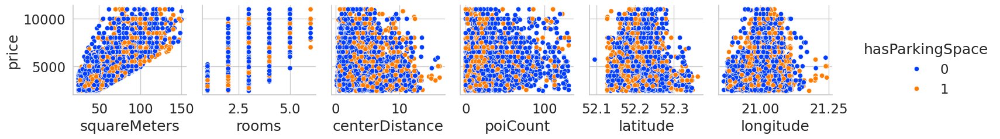

<Figure size 1000x700 with 0 Axes>

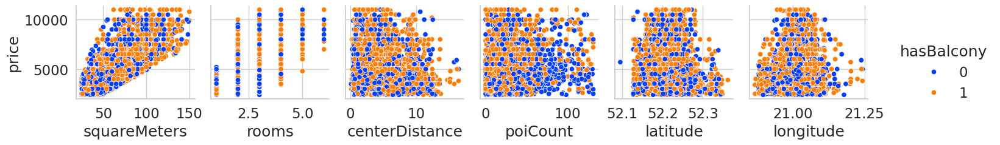

<Figure size 1000x700 with 0 Axes>

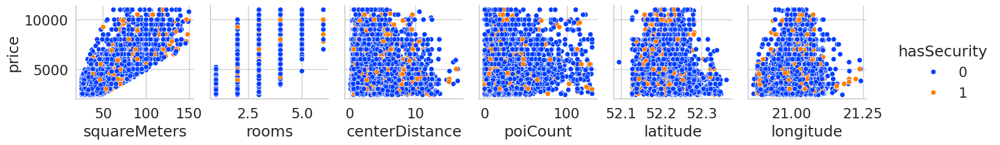

<Figure size 1000x700 with 0 Axes>

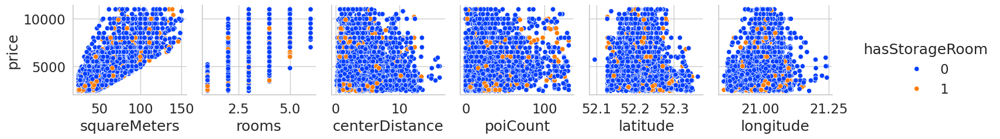

<Figure size 1000x700 with 0 Axes>

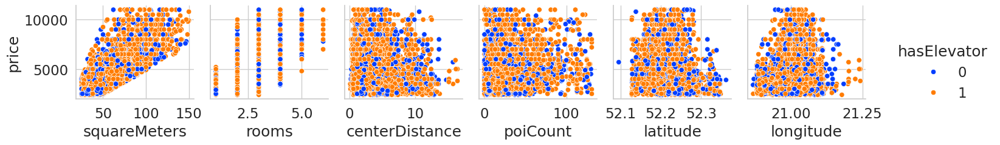

In [ ]:
binary_columns = ['hasParkingSpace', 'hasBalcony', 'hasSecurity','hasStorageRoom','hasElevator']
num_columns=['squareMeters', 'rooms','centerDistance','poiCount','latitude','longitude']
for i in range(len(binary_columns)):
    plt.figure()
    sns.pairplot(df_city,y_vars='price',x_vars=num_columns,hue=binary_columns[i])

Elevator and Balcony have an effect of the apt Price

**Notes:**  
- The larger the area, the higher the price. The relationship is almost linear.
- It turns out that if you want to live in the center, you can find cheap apartments there (not taking into account the standard or size of the apartment yet). At the same time, most expensive apartments are not very far from the center.
- The price slowly increases with the number of rooms. One-room apartments range up to approximately PLN 5,000 (without rent). But you can also find a 2 or 3-room apartment at the lowest price. The most expensive apartments (over PLN 10,000) actually always have more than 2 rooms.
- If you want your apartment to have a lot of PoiCount (interesting places within 500 m from the apartment), you don't need an expensive apartment (again - not taking into account the standard or size of the apartment yet)

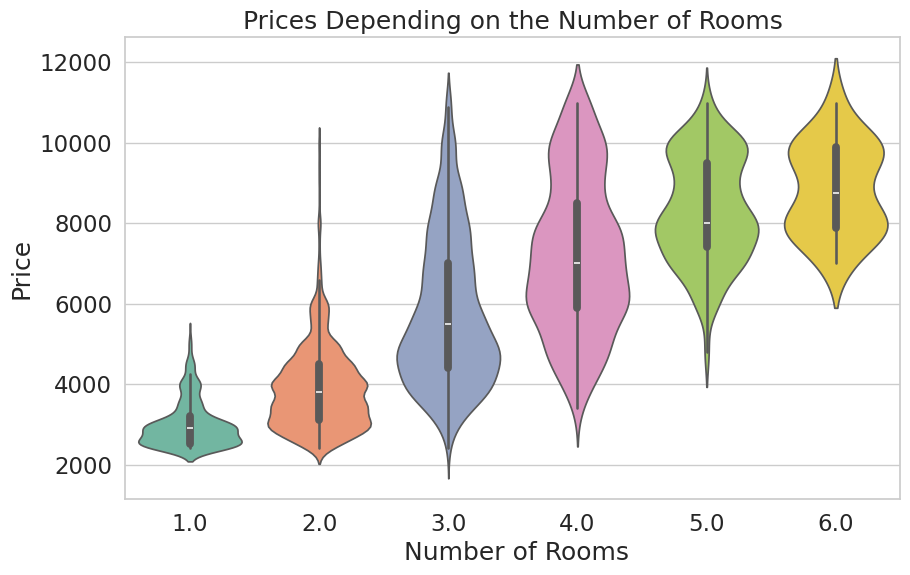

In [ ]:
# let's take a closer look at the prices of apartments depending on the number of rooms
plt.figure(figsize=(10, 6))
sns.violinplot(x='rooms', y='price', data=df,hue='rooms',palette=sns.color_palette("Set2",6),legend=False)

plt.xlabel(' Number of Rooms')
plt.ylabel('Price')
plt.title('Prices Depending on the Number of Rooms')
plt.show()

In [ ]:
# what is the relationship between the price per square meter and the size of the apartment?
df['price_per_square_meter'] = df['price'] / df['squareMeters']



<Figure size 1000x600 with 0 Axes>

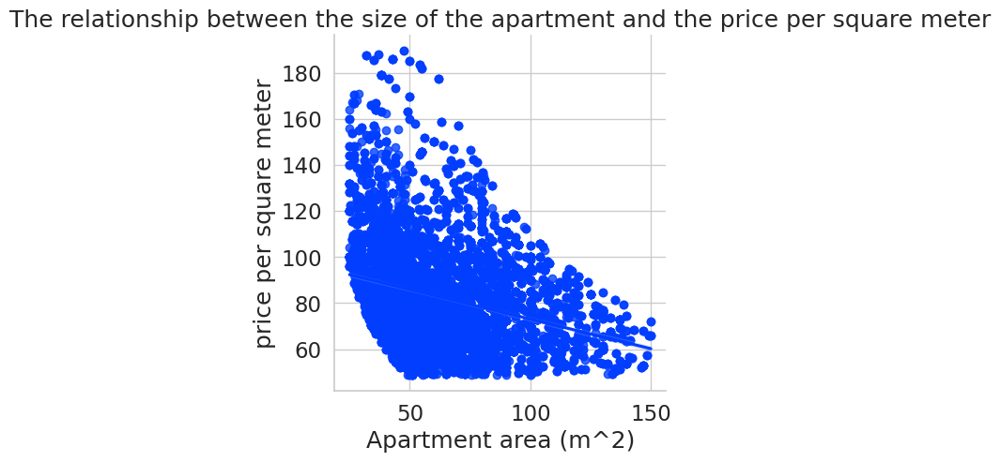

In [ ]:

plt.figure(figsize=(10, 6))
sns.lmplot(data=df,x='squareMeters', y='price_per_square_meter')
plt.title('The relationship between the size of the apartment and the price per square meter')
plt.xlabel('Apartment area (m^2)')
plt.ylabel('price per square meter')
plt.grid(True)
plt.show()

**Note**
In smaller apartments (up to about 50 square meters) we will pay more per square meter. Then the price stops falling so significantly.

In [ ]:
plt.figure(figsize=(10, 6))
scatter = sns.jointplot(data=df,x='centerDistance', y='price',kind='hex',color='orange')
scatter.fig.suptitle('Relationship between Distance from Center and Price   ')


plt.ylabel('Price')
plt.xlabel('center Distance')

plt.tight_layout()

plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
scatter = sns.lmplot(data=df,x='centerDistance', y='price',
                        col='rooms',palette=sns.color_palette("Set2",6),legend=True)
scatter.fig.suptitle('Relationship between Distance from Center and Price')


plt.ylabel('Price')
plt.xlabel('center Distance')

plt.tight_layout()

plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
scatter = sns.jointplot(data=df,x='poiCount', y='price',kind='hex',color='orange')
scatter.fig.suptitle('Relationship between poicount and Price   ')


plt.ylabel('Price')
plt.xlabel('PoiCount')

plt.tight_layout()

plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
scatter = sns.lmplot(data=df,x='poiCount', y='price',
                        col='rooms',palette=sns.color_palette("Set2",6),legend=True,line_kws={'color':'red'})
scatter.fig.suptitle('Relationship between poicount and Price')


plt.ylabel('Price')
plt.xlabel('poiCount')

plt.tight_layout()


In [ ]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df['squareMeters'], df['centerDistance'], c=df['price'],
                      cmap='viridis', s=10, alpha=0.7)

plt.xlabel('Apartment Size (m^2)')
plt.ylabel('center Distance')

plt.title('Relationship between Distance from Center and Apartment Size (color represents price)')

cbar = plt.colorbar(scatter, label='Price')
cbar.set_alpha(1)
cbar.draw_all()

plt.show()


In [ ]:
#let's look at columns with binary values
binary_columns = ['hasParkingSpace', 'hasBalcony', 'hasSecurity','hasStorageRoom','hasElevator','price']

binary_df = df_city[binary_columns]


In [ ]:

correlation_matrix = binary_df.corr()
plt.figure(figsize=(5, 3))
sns.heatmap(correlation_matrix, cmap='YlGnBu', annot=True,
            annot_kws={'fontsize':9}, mask=np.triu(np.ones_like(correlation_matrix, dtype=bool)))
plt.title('Correlation Matrix for Binary Columns')

plt.show()


Notes: There is a week correlation between the price and haselevator. SO mostlikly apartment with elevatore is expensive.

In [ ]:
binary_columns = ['hasParkingSpace', 'hasBalcony', 'hasSecurity','hasStorageRoom','hasElevator']

plt.figure(figsize=(16, 8))

for i, column in enumerate(binary_columns, 1):

    plt.subplot(2, 3, i)
    sns.kdeplot(data=binary_df, x='price', hue=column, fill=True)
    plt.title(f'Price Distribution with {column}')
    plt.xlabel('Price')

plt.tight_layout()
plt.show()
